# CMRM Assignment No. 2

In [11]:
import os
import numpy as np
import soundfile as sf
import librosa
import sklearn # pip install sklearn
import IPython.display as ipd
import matplotlib.pyplot as plt
from tqdm import tqdm # pip install tqdm
from nmf import nmf

## Question 1

In [12]:
# Define directories and lists
# Define directories
output_dir = "audio/results"
source_dir = "audio/sources"
target_dir = "audio/targets"
sources = ["Bees_Buzzing.mp3", "Chainsaw_Sawing.mp3", "Wind_Blowing.mp3"]
targets = ["Jingle_Bells_Boogie.wav", "Blue_Christmas.wav", "Have_Yourself.wav", "White_Christmas.mp3"]

# Create the output directory if it does not exist
os.makedirs(output_dir, exist_ok=True)

# Specific source and target for the task
source = sources[0]
target = targets[0] 

In [28]:
# Load signals, in 1D NumPy array. Each element in this array represents the amplitude of the waveform at a specific time, normalized to the range [-1,1]
Fs = 22050
source_signal, Fs = librosa.load(source_dir + "/" + source, sr=Fs) 
target_signal, Fs = librosa.load(target_dir + "/" + target, sr=Fs)

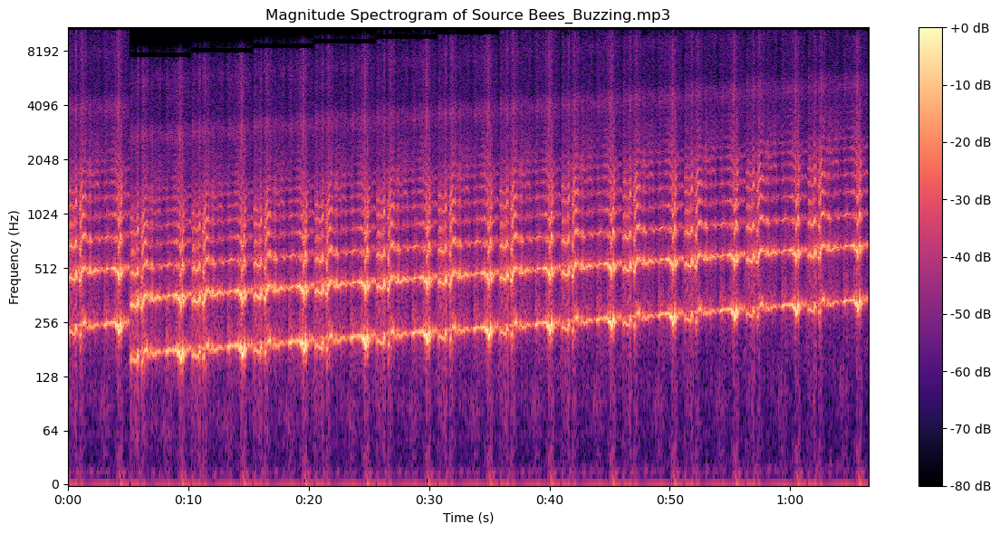

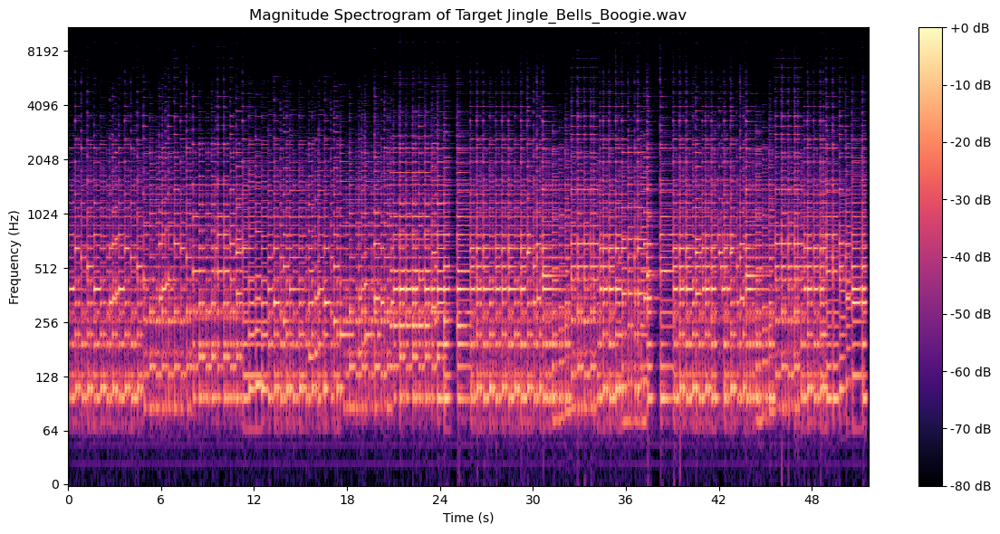

In [29]:
'''OBS: some proprieties about the stft method:
    - N_length, is the length of the windowed signal after padding with zeros (FFT window size).
    - H_size, is the step size between successive frames.
    - Gives a matrix with:
        -) N_length/2 rows. Each row rappresents a frequency bin. 
        -) the number of columns (number of time frames) is [(length of the source signal - N_length) / H_size] + 1
    So, by plotting using the librosa.display.specshow() method the matrix can be visualized such that for each time frame it can be seen the
    amplitude of the all frequencies bin.
'''
N_length = 4960
H_size = 1024

# STFT computation
# Source
X_source = librosa.stft(source_signal, n_fft = N_length, hop_length = H_size)

# Magnitude in amplitude and dbs
Y_source = np.abs(X_source)
Y_source_db = librosa.amplitude_to_db(Y_source, ref=np.max) #np.max: Normalizes the values so the highest amplitude corresponds to 0 dB.

# Plot
plt.figure(figsize=(12, 6))
librosa.display.specshow( Y_source_db,
    sr = Fs,
    hop_length = H_size,
    x_axis = 'time', # Visualize time on x axis
    y_axis = 'log')  # Human hearing perceives frequencies logarithmically, making a log scale more intuitive
plt.colorbar(format='%+2.0f dB')
plt.title(f'Magnitude Spectrogram of Source {source}')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()

# Target
X_target = librosa.stft(target_signal, n_fft = N_length, hop_length = H_size)

# Magnitude
Y_target = np.abs(X_target)
Y_target_db = librosa.amplitude_to_db(Y_target, ref=np.max)

# Plot
plt.figure(figsize=(12, 6))
librosa.display.specshow(
    Y_target_db,
    sr = Fs,
    hop_length = H_size,
    x_axis='time',
    y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Magnitude Spectrogram of Target {target}')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()
plt.show()

## Question 2

In [51]:
# Initialize activations randomly
H0 = np.random.rand(X_source.shape[1], X_target.shape[1])

# Initialize templates according to source frames
''' The summation means that each column is summed and the result is stored in a vector containing all the summations
the vector has the sum of the amplitudes of each time bin. Infact summing over the first dimension i means aggregating along the rows,
which gives a vector where each element corresponds to the sum of the elements in a particular column'''
epsilon = 1e-8

W0 = Y_source / (np.sum(Y_source, axis=0) + epsilon) # same number of rows and columns of of Y_source

Xs = X_source / (np.sum(Y_source, axis=0) + epsilon) # normalized X_source

# NMF
''' Let's compute W and H:
    - Template matrix W has the same number of rows of Y_target. Each column (template) that is used to build the components of the original matrix.
      Represent the spectral templates that correspond to various sound sources or features in the signal.
    - Activation matrix H has the same number of columns of Y_target. Represents how each template is activated or combined over time.
      It can be thought of as a time-dependent activation matrix that controls how much of each template contributes to the
      reconstruction at each time frame. Basically H tells us when and how much each component (or sound source) is present at each time step.
'''
W, H = nmf(
    Y_target,               # The target STFT magnitude matrix
    num_iter = 50,            # Number of iterations
    init_W = W0,              # Initialized W matrix
    init_H = H0,              # Initialized H matrix
    fix_W = True,             # Keep W fixed
    cont_polyphony = 10,      # Polyphony constraint
    cont_length = 7,          # Length constraint
    cont_grid = 5,            # Grid constraint
    cont_sparsen = (1, 7)     # Sparsity constraint
)

Y_target_approx = np.dot(W, H)

# Error norm (2 norm)
error_norm = np.linalg.norm(Y_target - Y_target_approx, 2)
print(f'The approximation error norm is {error_norm}')

Processing:   0%|          | 0/50 [00:00<?, ?it/s]

The approximation error norm is 3965.2840688561096


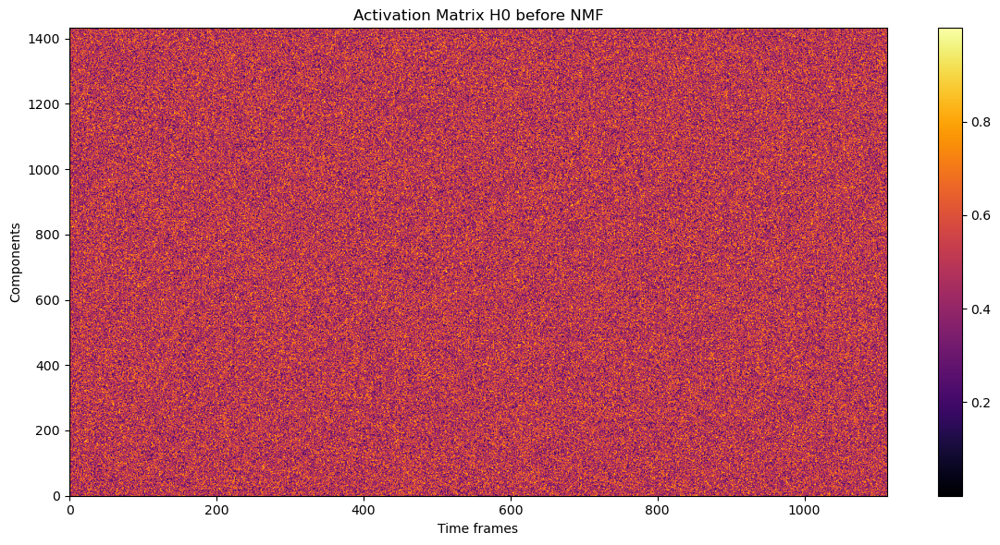

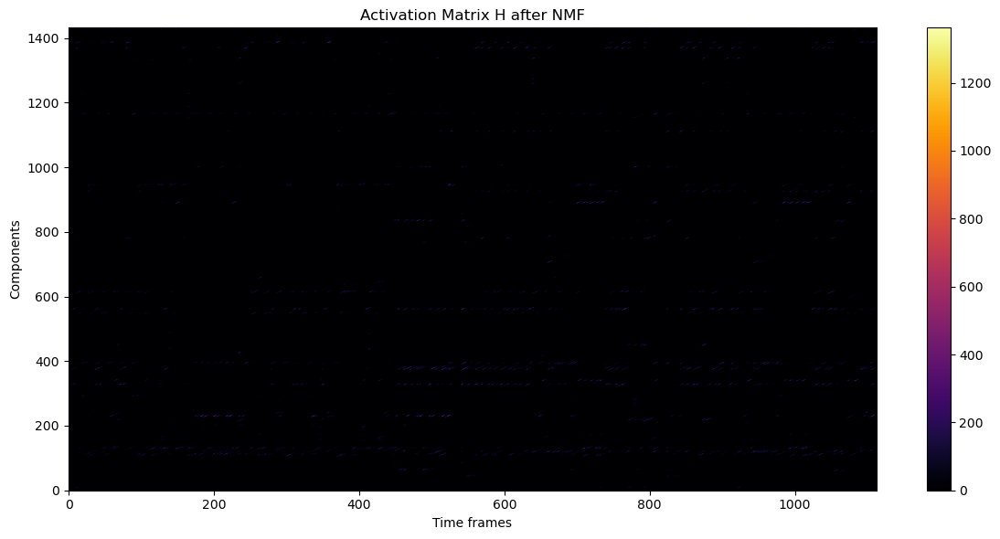

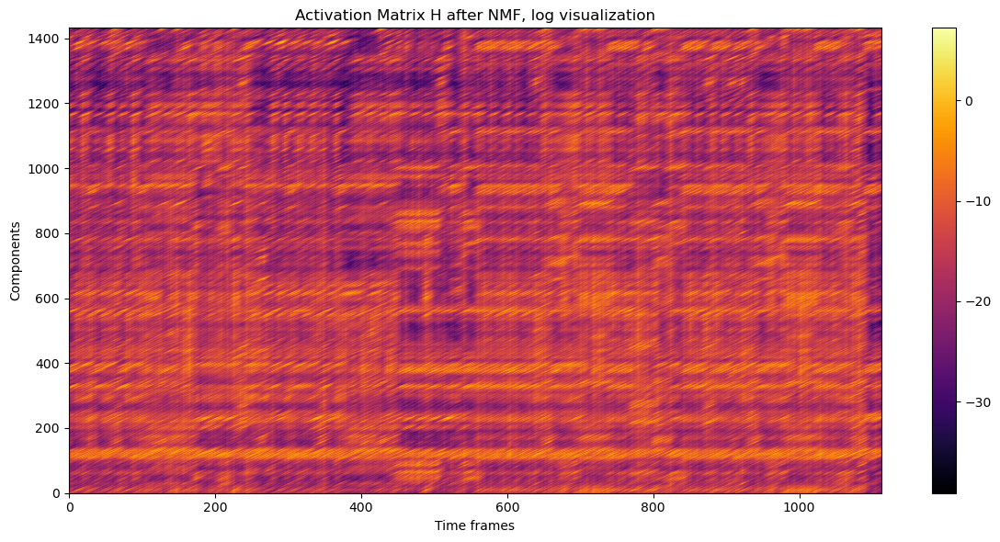

In [119]:
# Plot H0 and H

# Plot H0 (before NMF)
plt.figure(figsize=(12, 6))
plt.imshow(H0, aspect='auto', origin='lower', cmap='inferno')
plt.title("Activation Matrix H0 before NMF")
plt.colorbar()
plt.xlabel("Time frames")
plt.ylabel("Components")
plt.tight_layout()
plt.show()

# Plot H (after NMF)
plt.figure(figsize=(12, 6))
plt.imshow(H, aspect='auto', origin='lower', cmap='inferno')
plt.title("Activation Matrix H after NMF")
plt.colorbar()
plt.xlabel("Time frames")
plt.ylabel("Components")
plt.tight_layout()
plt.show()

# Plot H improving visualization 
''' Visualizing the plot of H it can be seen that the values are all close to zero, to improve the visualization it can be aplied the 
log. Beeing carefull of not having log(0), maybe adding a small epsilon close to zero to avoid problems.'''
plt.figure(figsize=(12, 6))
plt.imshow(np.log(H), aspect='auto', origin='lower', cmap='inferno')
plt.title("Activation Matrix H after NMF, log visualization")
plt.colorbar()
plt.xlabel("Time frames")
plt.ylabel("Components")
plt.tight_layout()
plt.show()

In [141]:
# Define a function to visualize the NMF components
def visualize_nmf(V, W, H, fs, time_res, gamma=2):
    """Visualize the matrices W, H, and compare reconstruction V ~ WH to V

    Args:
        V: target
        W: template matrix
        H: activation matrix
        fs: sampling frequency
        time_res: time resolution
        gamma: compression factor for V

    Returns:
        None
    """

    # Compress H. A time frame is taken every gamma frames.
    H_compressed = np.power(H, 1 / gamma)

    # Compress W: reducing the number of frequency bins. A frequency bin is taken every gamma bins.
    W_compressed = np.power(W, 1 / gamma)

    # Compressed approximation
    Y_target_approx_compressed = np.dot(W_compressed, H_compressed)

    # Compress target
    V_compressed = np.power(V, 1 / gamma)

    # Plot grid
    fig, axs = plt.subplots(2, 2, figsize=(12, 12))

    # Plot H_compressed 
    axs[0, 0].imshow(np.log(H_compressed), aspect='auto', origin='lower', cmap='inferno')
    axs[0, 0].set_title(f'Activation Matrix H compressed with gamma {gamma}')
    axs[0, 0].set_xlabel("Time frames")
    axs[0, 0].set_ylabel("Components")
    fig.colorbar(axs[0, 0].imshow(np.log(H_compressed), aspect='auto', origin='lower', cmap='inferno'), ax=axs[0, 0])

    # Plot W_compressed (0 - 2000)
    axs[0, 1].imshow(np.log(W_compressed[:2000, :]), aspect='auto', origin='lower', cmap='inferno')
    axs[0, 1].set_title(f'Template Matrix W compressed with gamma {gamma}')
    axs[0, 1].set_xlabel("Time frames")
    axs[0, 1].set_ylabel("Components (0-2000)")
    fig.colorbar(axs[0, 1].imshow(np.log(W_compressed[:2000, :]), aspect='auto', origin='lower', cmap='inferno'), ax=axs[0, 1])

    # Plot approximation compressed (0 - 2000 Hz) in db
    Y_target_approx_compressed_to_db = librosa.amplitude_to_db(Y_target_approx_compressed[:2000, :], ref=np.max)
    
    librosa.display.specshow(
        Y_target_approx_compressed_to_db,
        sr=4000,
        hop_length=time_res,
        x_axis='time',
        y_axis='log', ax=axs[1, 0]
    )
    axs[1, 0].set_title(f'Compressed approximation of Y_target with gamma {gamma}')
    axs[1, 0].set_xlabel('Time (s)')
    axs[1, 0].set_ylabel('Frequency (0 - 2000 Hz)')
    fig.colorbar(librosa.display.specshow(Y_target_approx_compressed_to_db, sr=4000, hop_length=time_res, x_axis='time', y_axis='log', ax=axs[1, 0]), ax=axs[1, 0])



    # Plot V_compressed compressed (0 - 2000 Hz) in db
    V_compressed_db = librosa.amplitude_to_db(V_compressed[:2000, :], ref=np.max)

    librosa.display.specshow(
        V_compressed_db,
        sr=4000,
        hop_length=time_res,
        x_axis='time',
        y_axis='log', ax=axs[1, 1]
    )
    axs[1, 1].set_title(f'Compressed Y_target with gamma {gamma}')
    axs[1, 1].set_xlabel('Time (s)')
    axs[1, 1].set_ylabel('Frequency (0 - 2000 Hz)')
    fig.colorbar(librosa.display.specshow(V_compressed_db, sr=4000, hop_length=time_res, x_axis='time', y_axis='log', ax=axs[1, 1]), ax=axs[1, 1])

    # Plot
    fig.suptitle(F'Approzimation with compression factor = {gamma}', fontsize=16)
    plt.tight_layout()
    plt.show()


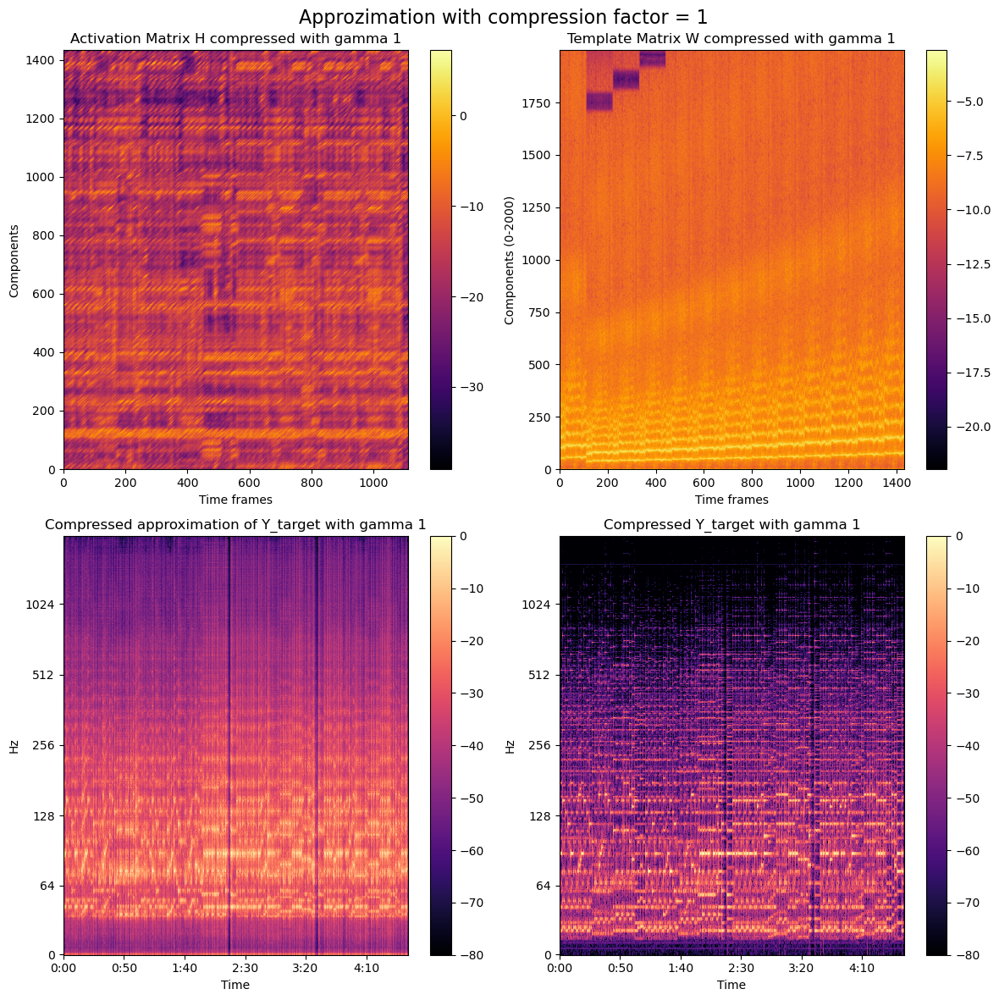

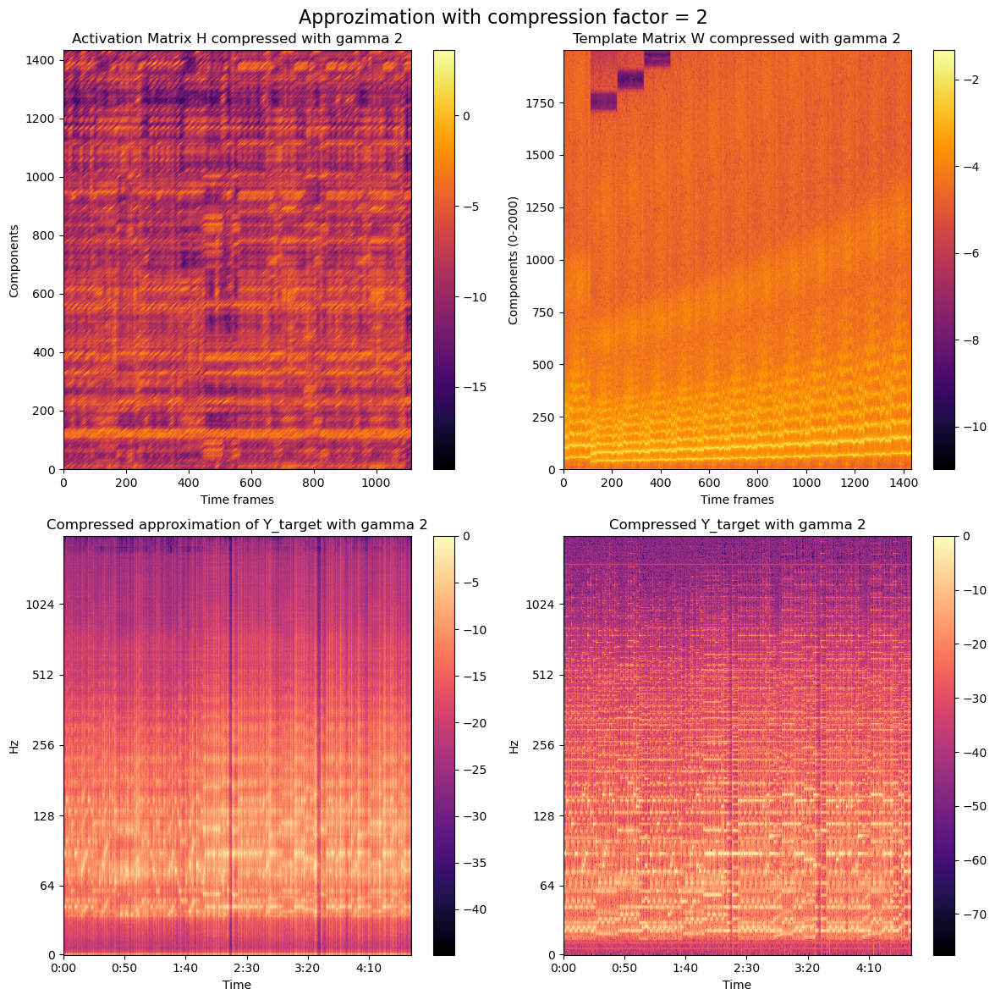

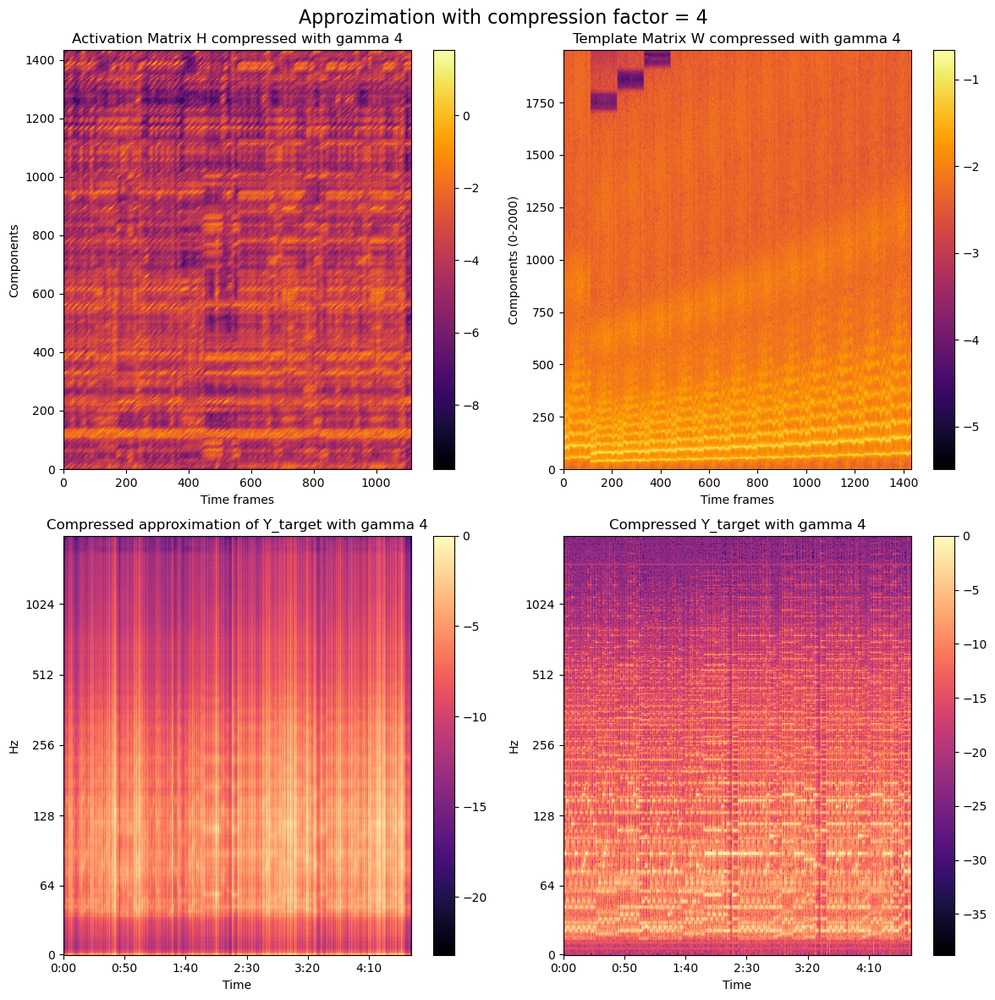

In [142]:
# Test visualize_nmf
visualize_nmf(Y_target, W, H, Fs, H_size, gamma=1)
visualize_nmf(Y_target, W, H, Fs, H_size, gamma=2)
visualize_nmf(Y_target, W, H, Fs, H_size, gamma=4)

## Question 3

In [19]:
# Replace the magnitude frames by complex valued frames


# Re-synthesize using ISTFT


# Re-synthesize using Griffin-Lim algorithm



In [20]:
# Save result


In [21]:
# Phase check 
# ISTFT


# Griffin-Lim


In [22]:
# Play target


In [23]:
# Play source


In [24]:
# Play new target - ISTFT


In [25]:
# Play new target - GF


## Question 4

In [26]:
# Define the function timbre_transfer
def timbre_transfer(t, s, fs, hop_size=1024, win_length=4096, resynth='gf', plot=False):
    """Transfer the timbre from the source to the target

    Args:
        t: target waveform
        s: source waveform
        fs: sampling frequency
        hop_size: hop size used for the STFT computation and the re-synthesis
        win_length: length of the window used for the STFT computation and the re-synthesis
        resynth: method used for the audio re-synthesis. Methods available: 'gf' = Griffin-Lim, 'istft' = Inverse STFT
        plot: boolean enabling visualization of NMF matrices and target spectrogram 

    Returns:
        y: audio waveform resynthesized through the chosen method
    """
    
    return y

## Question 5

In [27]:
# Use the function timbre_tansfer for all the possible combinations of source and target

